In [1]:
#IMPORTAMOS LIBRERIAS
import numpy as np
import math
from astropy.io import fits
import matplotlib.pyplot as plt
import matplotlib
import scipy.ndimage as ndimage
import glob
import copy
import pandas as pd
import os
from scipy.optimize import curve_fit
from scipy import optimize
from dateutil.parser import parse
from scipy.stats import poisson, norm
import datetime
from scipy.signal import find_peaks
from matplotlib import colors
import seaborn as sns

from glob import iglob
from tqdm import tqdm
import time

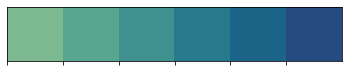

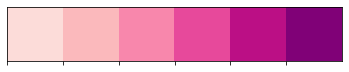

In [2]:
#DEFINIMOS PALETA DE COLOR AESTHETIC DE AZULES
cold_palette = sns.color_palette('crest') # Default color palette
#print(cold_palette)  # Prints the RGB tuples that make up this color palette
sns.palplot(cold_palette) # Plotting your palette!
#sns.palplot(cold_palette[0])

hot_palette = sns.color_palette('RdPu') 
sns.palplot(hot_palette)
#RdPu

#plt.show()

In [3]:
    #DEFINIMOS PARÁMETROS PARA LOS PLOTS
    plt.rcParams.update({
    "image.origin": "lower",
    "image.aspect": 1,
    "text.usetex": True,
    "grid.alpha": .5,
    }) 
    plt.rcParams.update(plt.rcParamsDefault)

Esta función me devuelve una variable con el número de la imagen.

In [4]:
def numerar_img(dir):
    file_path=dir
    file_name=os.path.basename(dir)
    last_characters = file_name[-7:-5]
    return(last_characters)

Esta función me guarda las imágenes en un nuevo directorio que yo le pongo

In [5]:
def save_file(file,dir,name):
    dir_original=os.getcwd()
    os.chdir(dir) 
    full_path = f'{dir}/{name}'
    file.savefig(full_path)
    os.chdir(dir_original)

## Creamos funciones para usar después:
1. Abrir imágenes, para importarlas, colocando el directorio. Está pensado para dos skippers.
2. Plotear las 4 celdas del skipper (en CONNIE funciona bien solo una de cada sensor).
3. Estimar el tiempo de lectura/exposición.

In [6]:
def abrir_imagen(dir_1):
    img1=fits.open(dir_1)
    #img1.info()
    n_img1=numerar_img(dir_1)
    return(img1, n_img1)

Podemos ver que tenemos en cada skipper-ccd los 4 canales uno por cada amplificacor y que las dimensiones son de 420 columnas y 1022 filas

Hay que tener en cuenta que las últimas 70 columnas son las que se corresponden al overscan (OS) que es la parte que leemos a mas en el serial register SR para poder tener una medida de pixeles sin carga. También hay que tener en cuenta que las primeras 8 columnas corresponden al prescan.

In [7]:
# definimos las regiones (máscaras) activa y de overscan
active_mask = np.s_[:, 9:-71] 
overscan_mask = np.s_[:, -65:-5] # eliminamos las primeras columnas y ultimas columnas 

In [52]:
def plotear_img_completas(img1):
    
    # Graficamos las imagenes completas substrayendo la mediana (global) del OS.  Esto lo hacemos para poner el valor 
    # de pixel vacio en el cero y así queda mas fácil y podemos ajustar bien la escala.
    # Para la img1
    plt.figure(figsize=(24,24))
    
    #for i in range(4):
        #plt.subplot(1,4,i+1)    
        #plt.imshow(img1[i].data[:,:]-np.median(img1[i].data[overscan_mask],axis=1, keepdims=True ), vmin=-1000, vmax=1000)
        #plt.title('IMG 1 - chid = {:d}'.format(i))
    plt.subplot(1,4,1)    
    plt.imshow(img1[0].data[:,:]-np.median(img1[0].data[overscan_mask],axis=1, keepdims=True ), vmin=-1000, vmax=1000)
    plt.title('IMG 1 - chid = {:d}'.format(0))

    

Adquisición de imagenes:
Estas imagenes son adquiridas sin exposición y después de haber hecho una limpieza de las mismas.  Es decir que el primer pixel tiene tiempo de exposición 0 y el último, máximo (ya que para que este pixel pueda ser leido se tuvieron que leer antes todos los pixeles).

In [9]:
def estimar_tiempo_lectura(img1):

    # Vamos a estimar el tiempo de exposición/lectura, para eso vamos a sacar la información del header
    #print(img1[0].header["DATEEND"],img1[0].header["DATESTART"])
    start = parse(img1[0].header["DATESTART"]+"Z").timestamp()
    end = parse(img1[0].header["DATEEND"]+"Z").timestamp()
    deltatime = datetime.timedelta(seconds=end-start)
    readout_time = deltatime.total_seconds()
    #print("Tiempo de exposición:")
    #print(readout_time, "s")
    #print(round(readout_time/3600,2), "h")
    #print(round(readout_time/86400,3), "days")
    
    return(readout_time)

5. Creo gaussiana simple 
6. Creo doble gaussiana con ganancia (g=m1-m2)

In [10]:
# Gaussiana de 1D centrada em m1 de sigma s1 y amplitud a1
def gaussian1(x,m1,s1,a1):
    return a1*np.exp(-1/2*((x-m1)/s1)**2)

# 2 Gaussianas de 1D con la segunda desplazada en g (ganancia) con respecto a la primera centrada en m1. Ambas tienen
# el mismos sigma s y amplitud de a1 para la primera y a2 para la segunda
def gaussian2(x,m1,s,a1,g,a2):
    return a1*np.exp(-1/2*((x-m1)/s)**2)+a2*np.exp(-1/2*((x-m1-g)/s)**2)


7. Prepara los datos para graficar
8. Ploteo imágenes que voy a usar
9. Ploteo cargas en escala log
10. Calibrar y ajustar ajusta por una doble gaussiana y calcula el ruido (en el label). Además, calcula ganancia.

In [55]:
def preparar_datos(img1):
    # selección de canales el 2 de la img1
    data2 = img1[0].data[:,:] #el indice de img1 esta raro, run 133 lleva 2 y run 125 0

    ysize =1022

    # subtract active medians
    
    data2 -= np.median( data2[overscan_mask], axis=1, keepdims=True )

    # remove median of first 100 rows
    verticaloverscan_mask = np.s_[:10,:]
    
    data2 -= np.median( data2[verticaloverscan_mask], axis=0, keepdims=True )
    return(data2) #devuelve primero lo de la imagen 1 

In [50]:
def graficar_img(img1,dir,name,num):
    # Graficar las imagenes seleccionadas
    data2 = img1[0].data[:,:]
    a=plt.figure(figsize=(8,10))
    
    
    plt.subplot(1,2,1)
    plt.imshow(data2, vmin=-500, vmax=500)
    plt.title(f'img1  - chid = 2, n°:{num}')              # ACDS-11
    
    
    save_file(a,dir,name)
    return a

In [28]:

def plot_dist_carga(data2,dir,name,num): #la de la img1 
    a=plt.figure(figsize=(24,6))
    
    plt.subplot(1,2,1)
    plt.grid()
    plt.title(f'Dist. de carga de AM n°:{num}')
    plt.yscale('log')
    plt.hist(data2[active_mask].flatten(),histtype='step',bins=200,range=[-1e3,2e3],label='img1 — AC –  chid = 2', color=cold_palette[1])
    plt.legend()
    
    plt.subplot(1,2,2)
    plt.grid()
    plt.title(f'Dist. de carga de OS n°:{num}')
    plt.yscale('log')
    plt.hist(data2[overscan_mask].flatten(),histtype='step',bins=200,range=[-1e3,2e3],label='img1 – OS — chid = 2', color=cold_palette[1])
    
    plt.legend()
    
    
    #save_file(a,dir,name)
    return a

In [29]:
def calibrar_y_ajustar(data2,dir,name,num):


    # usamos la parte activa y transformamos el array de 2dim en uno de 1dim usando flatten

    a=plt.figure(figsize=(18,6))
    plt.grid()

    # grafico el histograma de carga
    
    
    y,xb=np.histogram(data2[active_mask].flatten(),bins=np.linspace(-200,600,200))
    x=(xb[1:]+xb[:-1])/2
    # hago el fit
    
    plt.title(f'Histograma de carga de la parte activa n°:{num}')
    plt.plot(x,y,label='img1 — chid = 2', color=cold_palette[1])
    plt.legend()
    plt.xlabel("[ADUs]")
    plt.yscale("log")
    plt.ylabel("Entries")
    plt.yscale('log')
            
    try:
        # hago el fit
        popt, pcov = curve_fit(gaussian2, x, y, p0=[-10, 60, 10000, 450, 1000])
        gain2=popt[3]
        plt.plot(x,gaussian2(x,*popt),label="Gauss Fit $\sigma$: {:.3f} e-".format((popt[1])/gain2), color=hot_palette[1])
        #print('Ganancia img1 — chid = 2 in ADUs/e-: {:.3f}'.format((gain2)))
        #save_file(a,dir,name)
        return(gain2, a)
    
    except Exception:
        # Handle the error if it occurs, or simply pass
        #save_file(a,dir,name)
        #return(a)
        pass

In [74]:
#HAGO UNA ESPECIAL PARA CUANDO YA VIENEN CALIBRADAS

def calibrar_y_ajustar_cal(data2,dir,name,num):


    # usamos la parte activa y transformamos el array de 2dim en uno de 1dim usando flatten

    a=plt.figure(figsize=(18,6))
    plt.grid()

    # grafico el histograma de carga
    
    
    y,xb=np.histogram(data2[active_mask].flatten(),bins=np.linspace(-0.5,10.5,500))
    x=(xb[1:]+xb[:-1])/2
    # hago el fit
    
    
    plt.title(f'Histograma de carga de la parte activa n°:{num}')
    plt.plot(x,y,label='img1 — chid = 2', color=cold_palette[1])
    plt.legend()
    plt.xlabel("[e-]")
    plt.yscale("log")
    plt.ylabel("Entries")
    plt.yscale('log')
    
    '''       
    try:
        # hago el fit
        popt, pcov = curve_fit(gaussian2, x, y, p0=[-10, 60, 10000, 450, 1000])
        gain2=popt[3]
        plt.plot(x,gaussian2(x,*popt),label="Gauss Fit $\sigma$: {:.3f} e-".format((popt[1])/gain2), color=hot_palette[1])
        #print('Ganancia img1 — chid = 2 in ADUs/e-: {:.3f}'.format((gain2)))
        #save_file(a,dir,name)
        return(gain2, a)
    
    except Exception:
        # Handle the error if it occurs, or simply pass
        #save_file(a,dir,name)
        #return(a)
        pass
        
    '''

11. ADU_a_e pasa datos de ADUs a electrones. Se puede graficar con plot_dist_carga.

In [30]:
def ADU_a_e(data2,gain2):
    # Calibro los datos, a partir de aqui vamos a tener las cargas en e- y no mas en ADUs
    data2/=gain2
    return data2 

In [31]:

def ruido_de_lectura_OS(data2,dir,name,num):
    a=plt.figure(figsize=(24,6))
    
    #img1
    # noise in the OS
    plt.grid()
    plt.title(f'Ruido de lectura del OS n°:{num}')
    y,xb = np.histogram(data2[overscan_mask].flatten(), bins = np.arange(-0.5, 0.5, 0.05) )
    x=(xb[1:]+xb[:-1])/2
    plt.plot(x,y,label='img1 - chid = 2', color=cold_palette[1])
    try:
        popt, pcov = curve_fit( gaussian1, x, y, p0=[ 0, 0.2, 1e5] )
            # get error from pcov
        perr = np.sqrt(np.diag(pcov))
        sigmaOS2 = popt[1]
        sigmaOS2_err = perr[1]
        plt.plot(x,gaussian1(x,*popt),label="Gauss Fit $/sigma$: {:.3f} e-".format(sigmaOS2), color=hot_palette[1])
        plt.legend()
        plt.xlabel("[e-]")
        plt.yscale("log")
        plt.ylabel("Entries")    
    except RuntimeError:
        print(f"Error - gain fit failed, {path}") #error
        print("This file will not be saved")
        # returns at exception without writing
        #return
    #     print( popt )
    
    

    #print('Ruido de lectura img1 — chid = 2 in e-: {:.3f} ± {:.3f}'.format(sigmaOS2,sigmaOS2_err))
    #save_file(a,dir,name)
    return(sigmaOS2,sigmaOS2_err)
    

## SEE

In [57]:
def enmascarar_eventos(data2):
    itera=10

    mask = ndimage.binary_dilation(data2>5,iterations=itera,structure=[[1,1,1],[1,1,1],[1,1,1]])  
    data2mask = data2 - 1000000*mask.astype(data2.dtype)
    data2mask = np.ma.masked_less(data2mask, -50000)


    plt.figure(figsize=(9,18))
    plt.subplot(1,2,1)
    plt.imshow(data2, vmin=-1, vmax=1, origin='lower')
    plt.title('img1 - chid = 2')
    plt.subplot(1,2,2)
    plt.imshow(data2mask, vmin=-1, vmax=1, origin='lower')
    plt.title('img1 - chid = 2 - mask')
    
    return(data2mask)
    

In [33]:
# Función convolución entre la distribución Gaussina y Poisson para poder estimar la tasa de eventos de un electrón en 
# la región activa. Ver tesis de Miguel para referencia.
def convolucion(x, mu, sigma, A, lamb, Nmax=10):
    y = 0.
    for i in range(0, Nmax+1):
        y += (lamb**i)/float(math.factorial(i)) * \
            np.exp(-0.5*((x-i-mu-lamb)/float(sigma))**2)
    return A*np.exp(-lamb)*y/(np.sqrt(2*np.pi*sigma**2))

In [34]:
def ploteo_convolucion(data2mask):

    plt.subplot(1,2,2)
    y, xb = np.histogram(data2mask[active_mask].flatten(),range=[-0.5,2.5],bins=200)
    x = (xb[1:]+xb[:-1])/2
    popt, pcov = curve_fit(convolucion, x, y, p0=[-0.4, 0.2, 1000, 0.1])
    plt.plot(x, y,label="img2 - chid = 0")
    plt.plot(x, convolucion(x, *popt), label="Fit. $\sigma$: {:.3f} e- -  $\lambda$: {:.4f} e-/pix ".format(abs(popt[1]),popt[3]),color='red')
    plt.xlabel("e-")
    plt.ylabel("Entries")
    plt.yscale("log")
    plt.title(" Active Part")
    plt.legend()
    noise2 = popt[1]
    lambda2 = popt[3]
    #plt.show()
    return(noise2, lambda2)

    # lambda que es la tasa está en unidades de e-/pix para esa imagen

In [44]:
#Creo nuevo directorio para el análisis de imágenes SOLO UNA VEZ
directory = 'data_125'
parent_dir = 'c:/Users/Zoe/Desktop/Labo 67/imagenes/'
path = os.path.join(parent_dir, directory)
os.mkdir(path)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'c:/Users/Zoe/Desktop/Labo 67/imagenes/data_125'

 50%|█████     | 5/10 [00:08<00:12,  2.58s/it]C:\Users\Zoe\AppData\Local\Temp\ipykernel_9452\2722164839.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  a=plt.figure(figsize=(8,10))
100%|██████████| 10/10 [00:13<00:00,  1.30s/it]


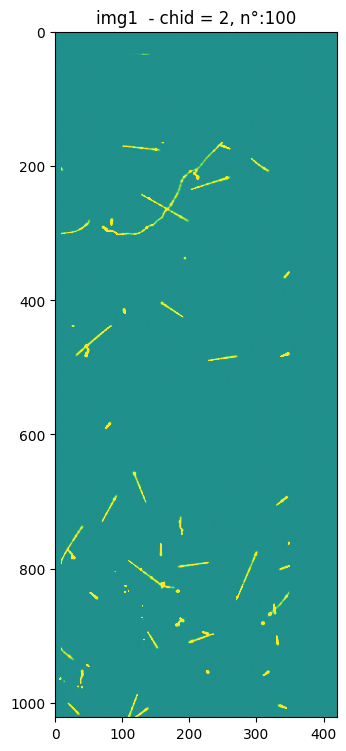

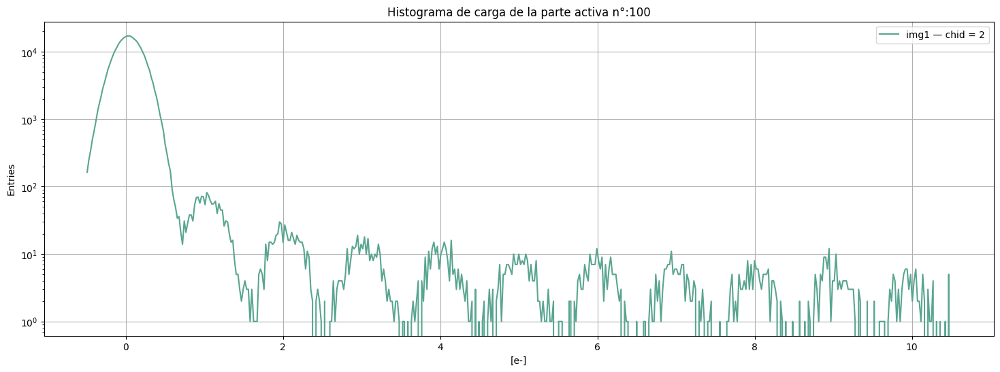

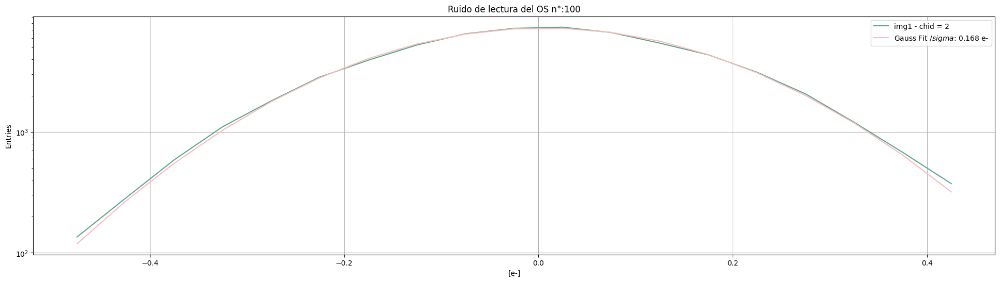

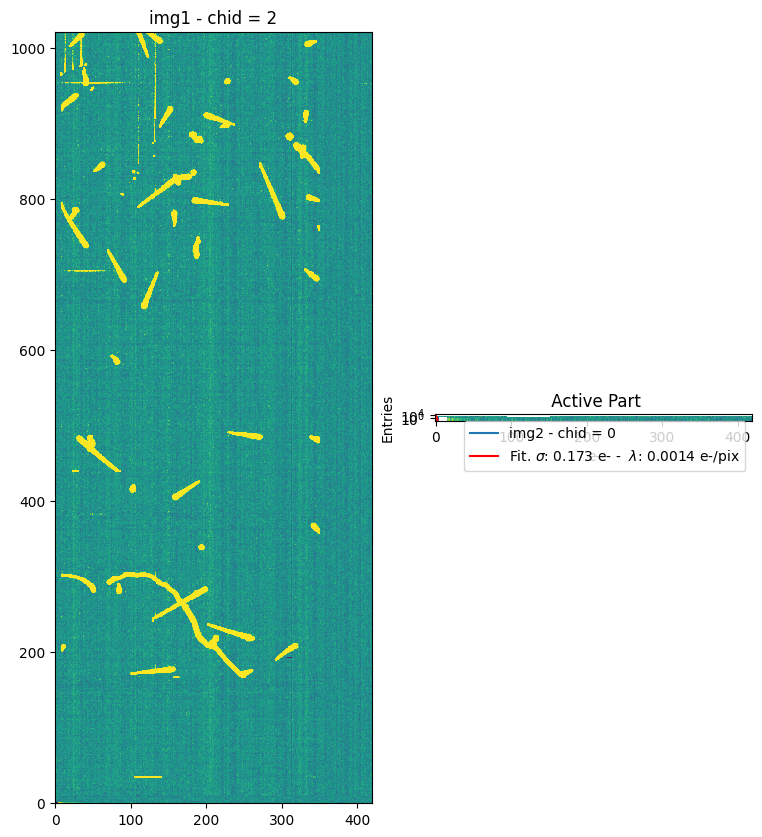

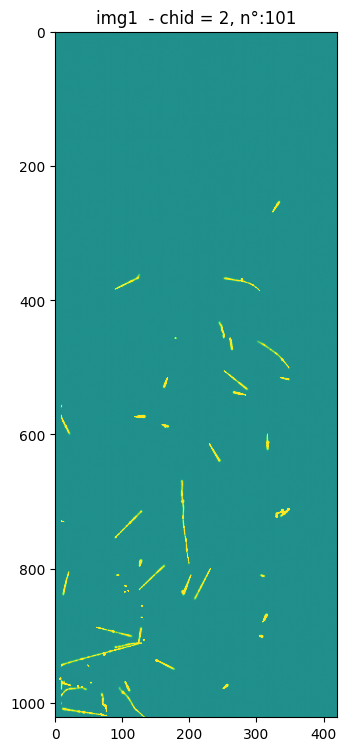

...

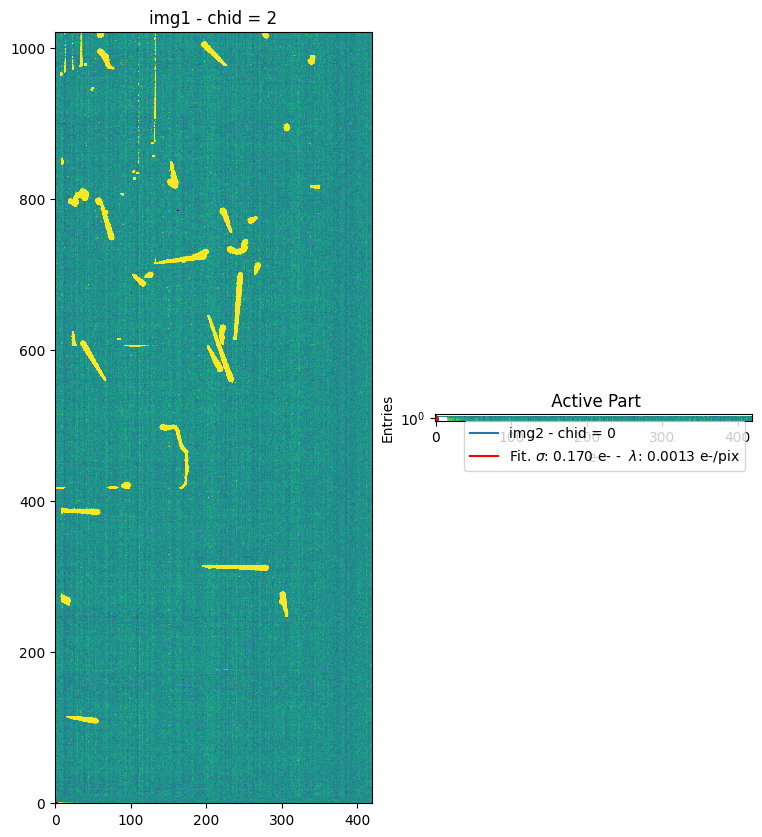

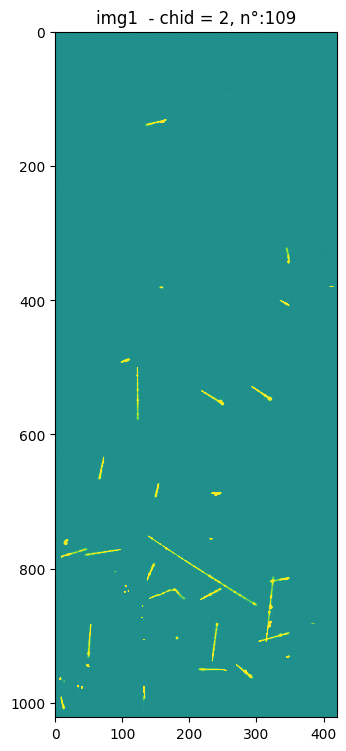

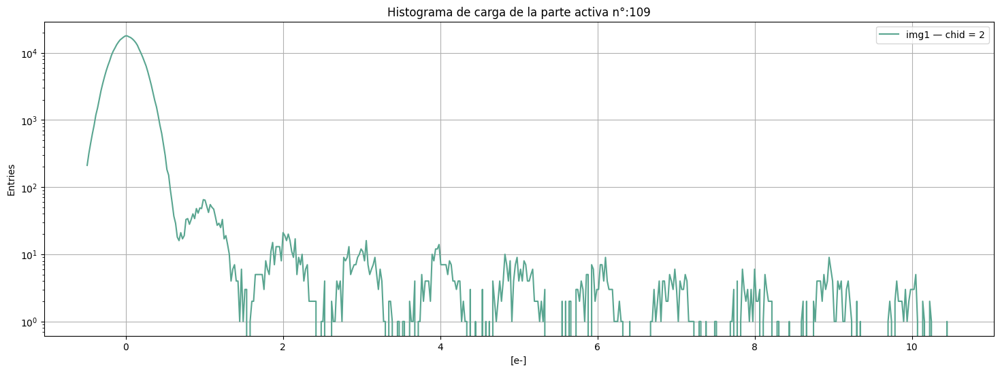

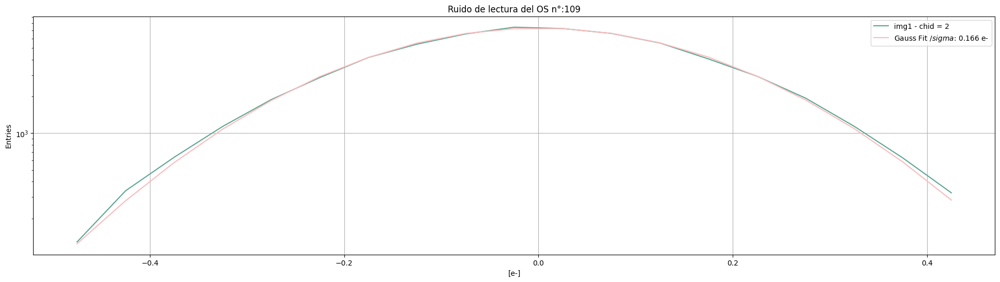

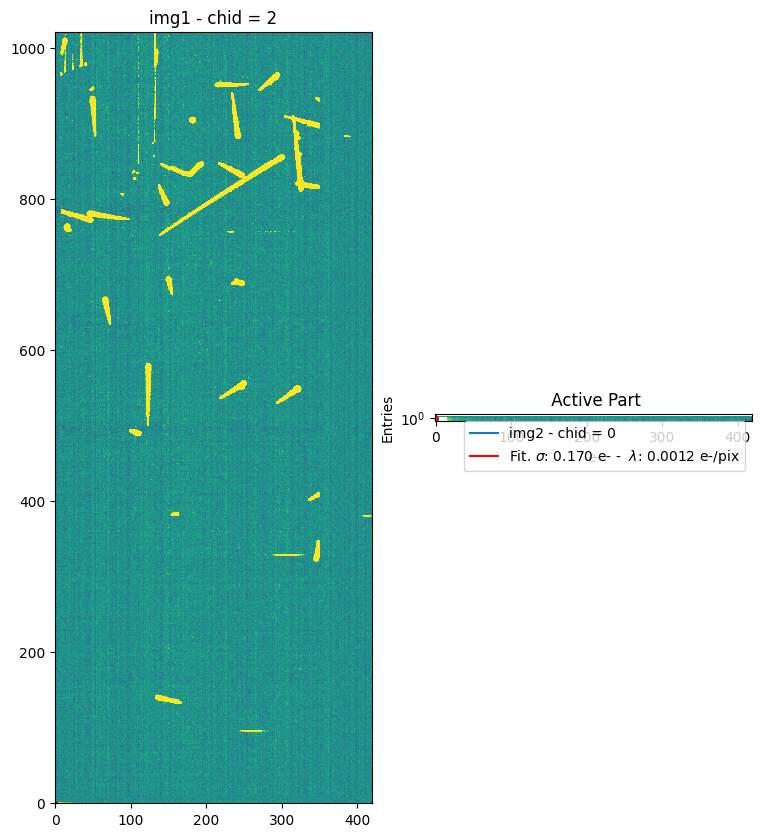

In [75]:
directorios=[]
numeros=[]
os.chdir('C:/Users/Zoe/Desktop/Labo 67/imagenes/125')
for pathname in iglob('*img1_*.fits'):
    directorios.append(pathname)
    #print(pathname)
    numeros.append(pathname.split('img1_',1)[1].split('.',1)[0])


ruido_txt=f'ruido_T.txt'
dir_ruido_txt=os.path.join(path, ruido_txt)

ajuste_si=[]

with open(dir_ruido_txt, "w") as ruido:
    ruido.write(f"ID,sigmaOS,err_sigmaOS,noise,lambda \n") #agregar a mano!!
    for i in tqdm(range(0,len(directorios))):
        #creo txt para guardar info
        nombre_txt=f'{numeros[i]}_info.txt'
        archivo=os.path.join(path, nombre_txt)
        #print(archivo)
        
        
        img=abrir_imagen(directorios[i])[0]
        #plotear_img_completas(img)
        t_lect=estimar_tiempo_lectura(img)
        #--------------------------
        data=preparar_datos(img) #devuelve data
        #print('La imagen a analizar es:')
        plot=graficar_img(img,path,numeros[i],numeros[i]) #guardo esta
        dir_temp='c:/Users/Zoe/Desktop/Labo 67/imagenes/variacion_T/'
        name=f'{numeros[i]}_img'
        save_file(plot, dir_temp,name)
        #print('La distribución de carga es:')
        name2=f'{numeros[i]}_dist_de_carga'
        #plot_dist_carga(data,path,name2,numeros[i]) #guardo esta
        #print('El ruido')
        name3=f'{numeros[i]}_parte_activa'
        try:
            gain=calibrar_y_ajustar_cal(data,path,name3,numeros[i])[0]  #guardo esta #OJO con cual ponemos
            data=ADU_a_e(data,gain) 
            ajuste_si.append(1)
        except Exception:
            ajuste_si.append(-1)
        
        name4=f'{numeros[i]}_ruido_os'
        sigmaOS,err_sigmaOS=ruido_de_lectura_OS(data,path,name4,numeros[i])#guardo esta
        #ruido.write(f"{numeros[i]},{sigmaOS},{err_sigmaOS}\n")
    
        datamask = enmascarar_eventos(data)
        noise2, lambda2 = ploteo_convolucion(datamask)
        
        
        ruido.write(f"{numeros[i]},{sigmaOS},{err_sigmaOS},{noise2},{lambda2}\n")
        
        # This will create the txt file if it doesn't exist or overwrite it if it does
        with open(archivo, "w") as file:
            # Write content to the file
            file.write(f"Tiempo de lectura:{t_lect} s\n")
            file.write(f"Tiempo de lectura:{t_lect/3600} min\n")
            file.write(f"Tiempo de lectura:{t_lect/86400} h\n")
            file.write(f"Ganancia:{gain}\n")
            file.write(fr"Ruido de lectura:{sigmaOS} ± {err_sigmaOS}")
        
#10.5
#electrones